In [1]:
import numpy as np
import tensorflow as tf
import keras
import cv2
from keras.layers import MaxPool2D,Conv2D,UpSampling2D,Input,Dropout
from keras.models import Sequential
import os
from tqdm import tqdm
import re
import matplotlib.pyplot as plt

In [2]:
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)

In [3]:
SIZE = 160
color_img = []
path = '/kaggle/input/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
  if i == '5000.jpg':
        break
  else:    
        img = cv2.imread(path + '/'+i,1)
        
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        color_img.append(tf.keras.utils.img_to_array(img))

 70%|███████   | 5000/7129 [00:39<00:16, 126.79it/s]


In [4]:
gray_img = []
path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
     if i == '5000.jpg':
        break
     else: 
        img = cv2.imread(path + '/'+i,1)

        img = cv2.resize(img, (SIZE, SIZE))
        img = img.astype('float32') / 255.0
        gray_img.append(tf.keras.utils.img_to_array(img))

 70%|███████   | 5000/7129 [00:36<00:15, 136.39it/s]


In [5]:
def plot_images(color,grayscale):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
   
    plt.show()

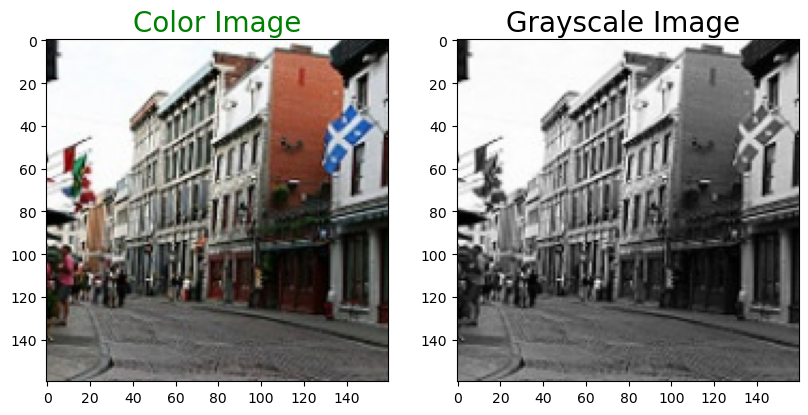

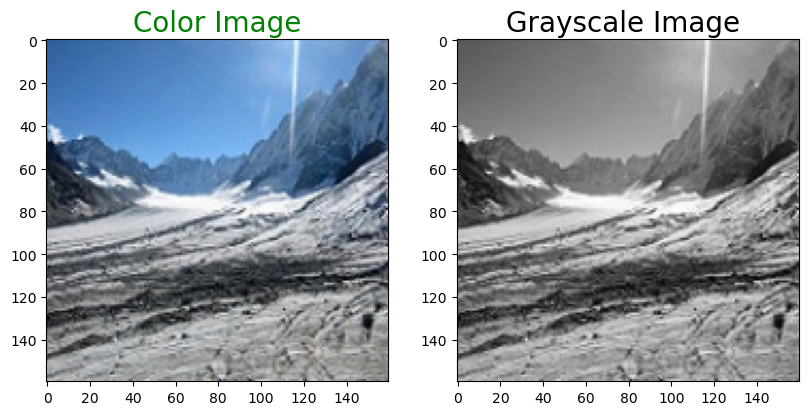

In [6]:
for i in range(3,5):
     plot_images(color_img[i],gray_img[i])

In [7]:
train_gray_image = gray_img[:4500]
train_color_image = color_img[:4500]

test_gray_image = gray_img[4500:]
test_color_image = color_img[4500:]

train_g = np.reshape(train_gray_image,(len(train_gray_image),SIZE,SIZE,3))
train_c = np.reshape(train_color_image, (len(train_color_image),SIZE,SIZE,3))
print('Train color image shape:',train_c.shape)

Train color image shape: (4500, 160, 160, 3)


In [8]:
test_gray_image = np.reshape(test_gray_image,(len(test_gray_image),SIZE,SIZE,3))
test_color_image = np.reshape(test_color_image, (len(test_color_image),SIZE,SIZE,3))
print('Test color image shape',test_color_image.shape)

Test color image shape (500, 160, 160, 3)


In [9]:
from keras import layers
def down(filters , kernel_size, apply_batch_normalization = True):
    downsample = tf.keras.models.Sequential()
    downsample.add(layers.Conv2D(filters,kernel_size,padding = 'same', strides = 2))
    if apply_batch_normalization:
        downsample.add(layers.BatchNormalization())
    downsample.add(keras.layers.LeakyReLU())
    return downsample

def up(filters, kernel_size, dropout = False):
    upsample = tf.keras.models.Sequential()
    upsample.add(layers.Conv2DTranspose(filters, kernel_size,padding = 'same', strides = 2))
    if dropout:        
#       upsample.dropout(0.2)
        upsample.add(Dropout(0.2))
    upsample.add(keras.layers.LeakyReLU())
    return upsample

In [10]:
def model():
    inputs = layers.Input(shape= [160,160,3])
    d1 = down(128,(3,3),False)(inputs)
    d2 = down(128,(3,3),False)(d1)
    d3 = down(256,(3,3),True)(d2)
    d4 = down(512,(3,3),True)(d3)
    
    d5 = down(512,(3,3),True)(d4)

    u1 = up(512,(3,3),True)(d5)
    u1 = layers.concatenate([u1,d4])
    u2 = up(256,(3,3),True)(u1)
    u2 = layers.concatenate([u2,d3])
    u3 = up(128,(3,3),True)(u2)
    u3 = layers.concatenate([u3,d2])
    u4 = up(128,(3,3),True)(u3)
    u4 = layers.concatenate([u4,d1])
    u5 = up(3,(3,3),True)(u4)
    u5 = layers.concatenate([u5,inputs])
    output = layers.Conv2D(3,(2,2),strides = 1, padding = 'same')(u5)
    return tf.keras.Model(inputs=inputs, outputs=output)

In [11]:
model = model()
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 80, 80, 128)  3584        ['input_1[0][0]']                
                                                                                                  
 sequential_1 (Sequential)      (None, 40, 40, 128)  147584      ['sequential[0][0]']             
                                                                                                  
 sequential_2 (Sequential)      (None, 20, 20, 256)  296192      ['sequential_1[0][0]']       

In [20]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 0.001), loss = 'mean_absolute_error',
              metrics = ['acc'])

model.fit(train_g, train_c, epochs = 100 ,batch_size = 50, verbose = 1)

Epoch 1/100


2023-04-20 15:38:25.990108: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape inmodel/sequential_5/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


90/90 [==============================] - 19s 162ms/step - loss: 0.0196 - acc: 0.8172
Epoch 2/100
90/90 [==============================] - 15s 161ms/step - loss: 0.0193 - acc: 0.8184
Epoch 3/100
90/90 [==============================] - 15s 162ms/step - loss: 0.0197 - acc: 0.8155
Epoch 4/100
90/90 [==============================] - 14s 161ms/step - loss: 0.0194 - acc: 0.8190
Epoch 5/100
90/90 [==============================] - 15s 161ms/step - loss: 0.0195 - acc: 0.8163
Epoch 6/100
90/90 [==============================] - 15s 161ms/step - loss: 0.0197 - acc: 0.8151
Epoch 7/100
90/90 [==============================] - 15s 162ms/step - loss: 0.0196 - acc: 0.8161
Epoch 8/100
90/90 [==============================] - 15s 162ms/step - loss: 0.0193 - acc: 0.8194
Epoch 9/100
90/90 [==============================] - 15s 162ms/step - loss: 0.0194 - acc: 0.8182
Epoch 10/100
90/90 [==============================] - 15s 161ms/step - loss: 0.0196 - acc: 0.8165
Epoch 11/100
90/90 [=====================

In [24]:
def plot_images(color,grayscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('Color Image', color = 'green', fontsize = 20)
    plt.imshow(color)
    plt.subplot(1,3,2)
    plt.title('Grayscale Image ', color = 'black', fontsize = 20)
    plt.imshow(grayscale)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
   
    plt.show()

1/1 [==============================] - 0s 22ms/step


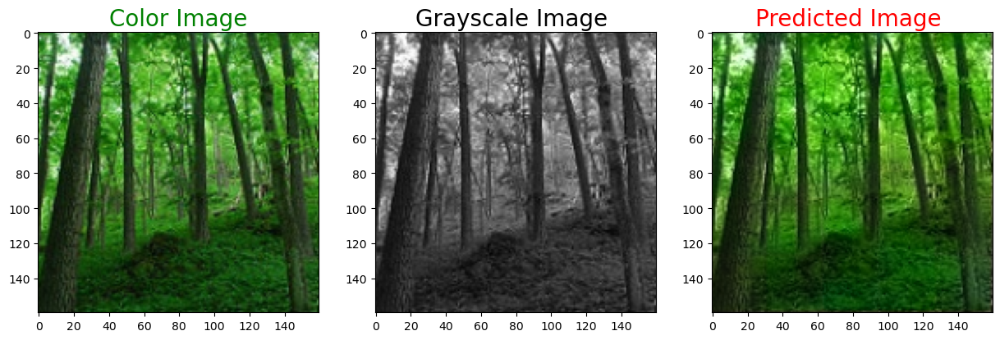

1/1 [==============================] - 0s 23ms/step


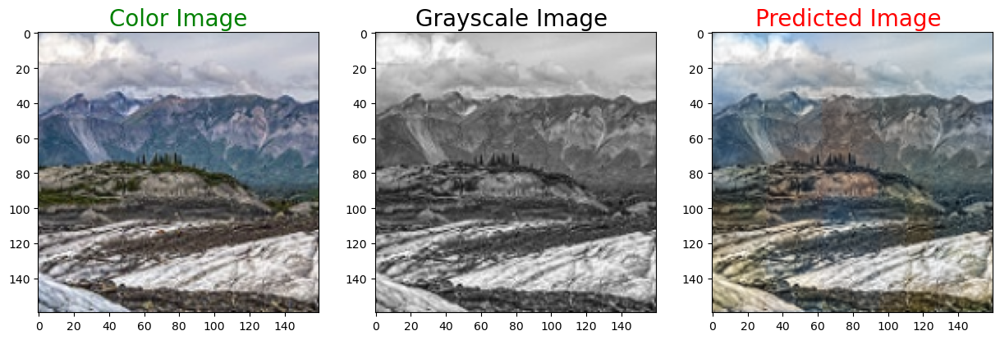

1/1 [==============================] - 0s 22ms/step


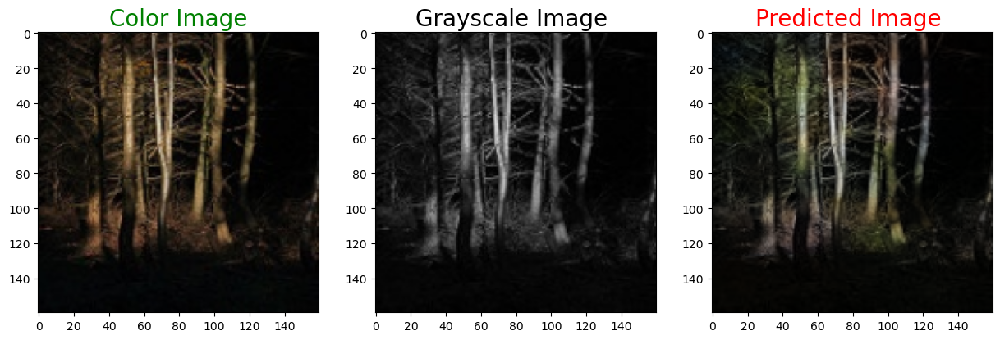

1/1 [==============================] - 0s 20ms/step


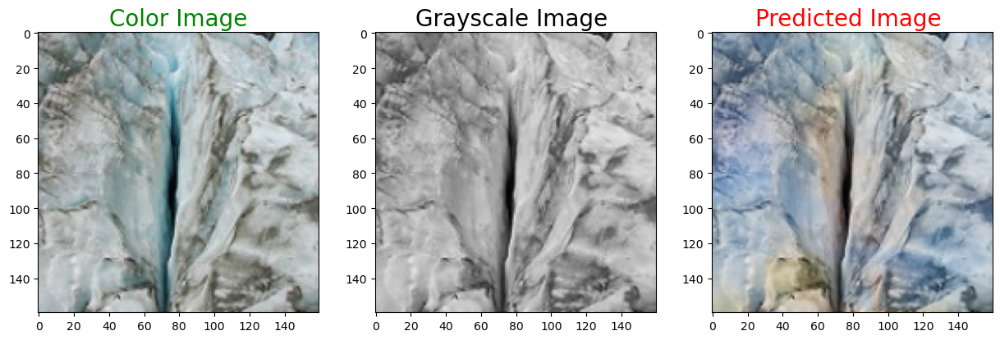

1/1 [==============================] - 0s 21ms/step


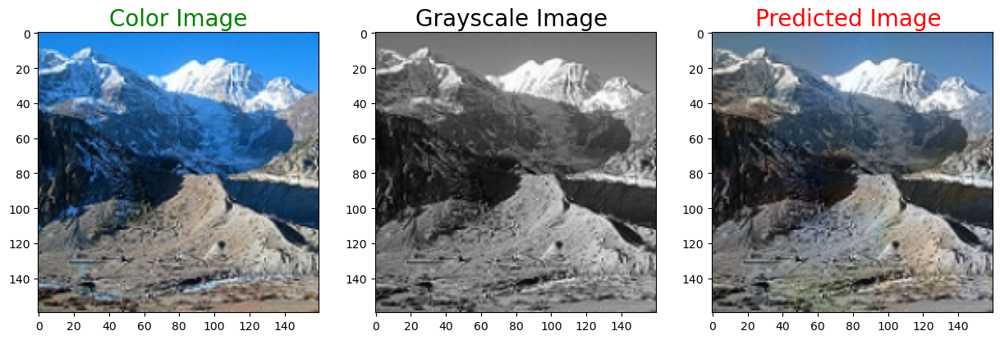

1/1 [==============================] - 0s 20ms/step


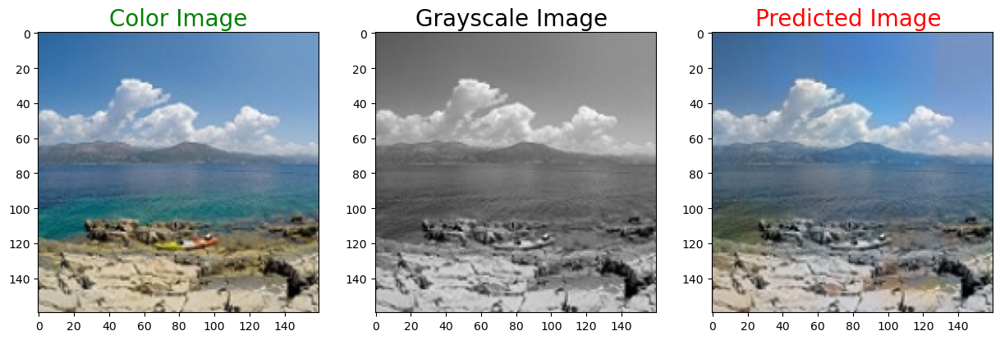

1/1 [==============================] - 0s 20ms/step


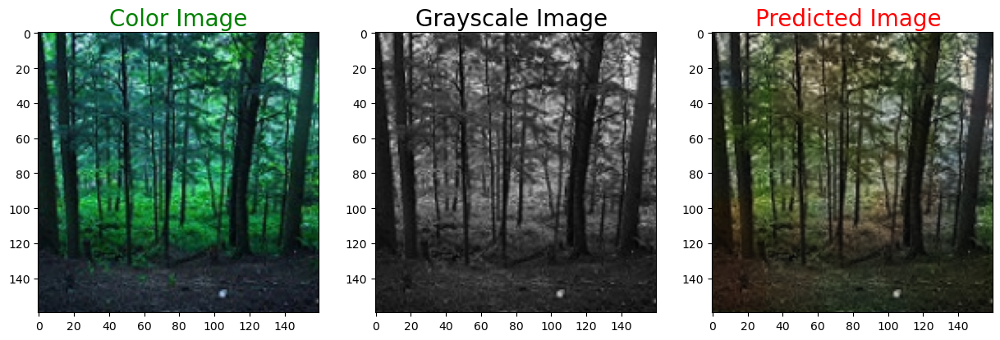

1/1 [==============================] - 0s 21ms/step


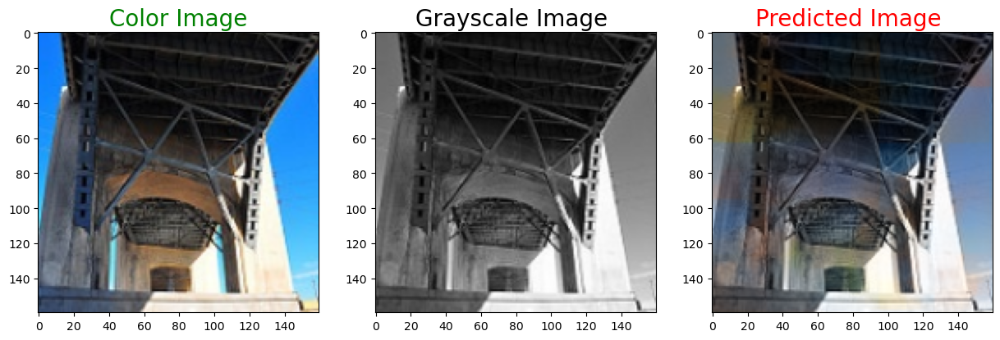

1/1 [==============================] - 0s 20ms/step


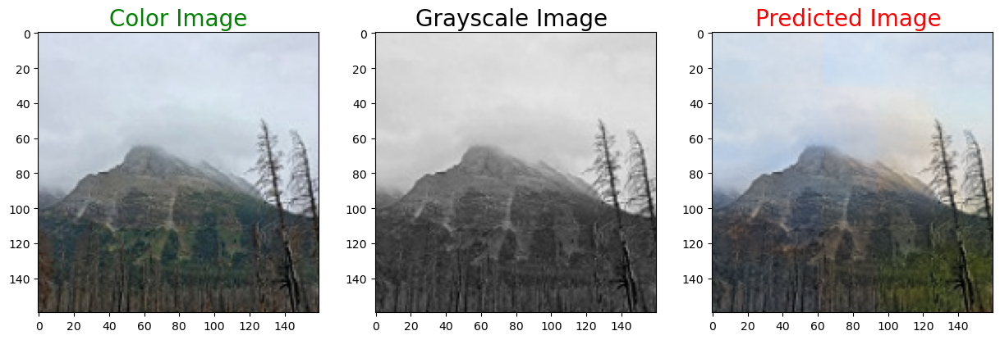

1/1 [==============================] - 0s 20ms/step


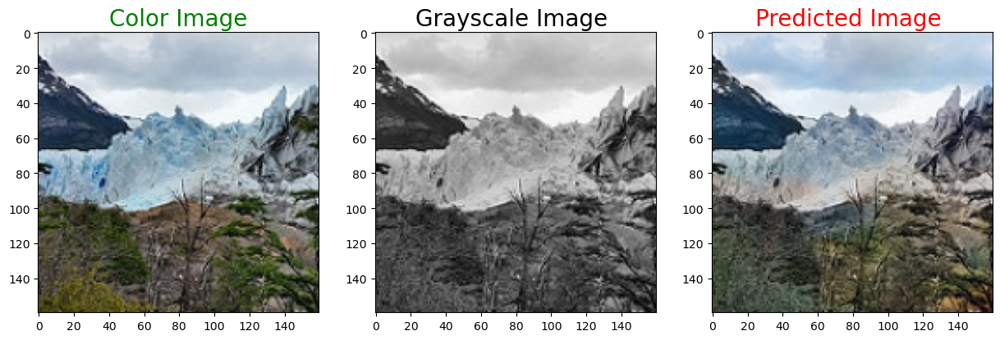

1/1 [==============================] - 0s 20ms/step


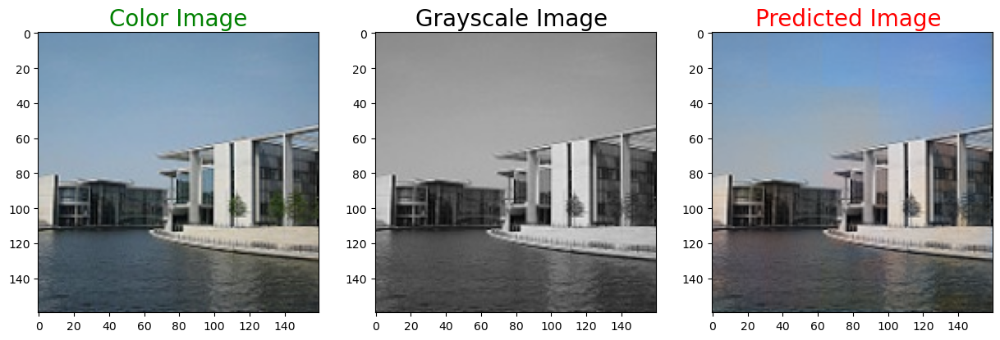

1/1 [==============================] - 0s 20ms/step


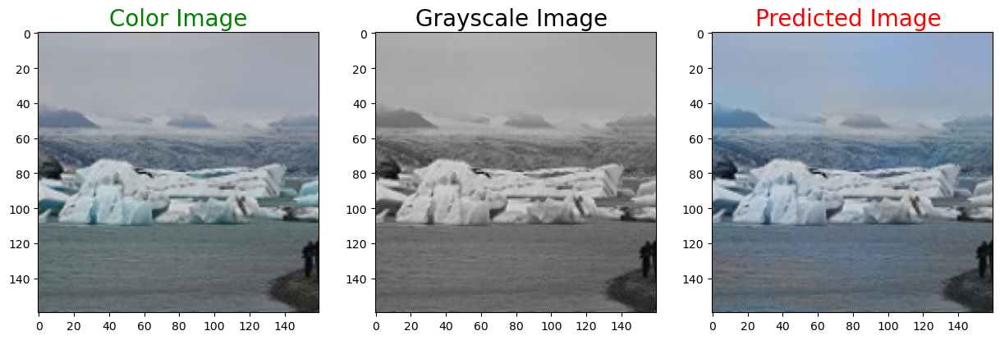

1/1 [==============================] - 0s 21ms/step


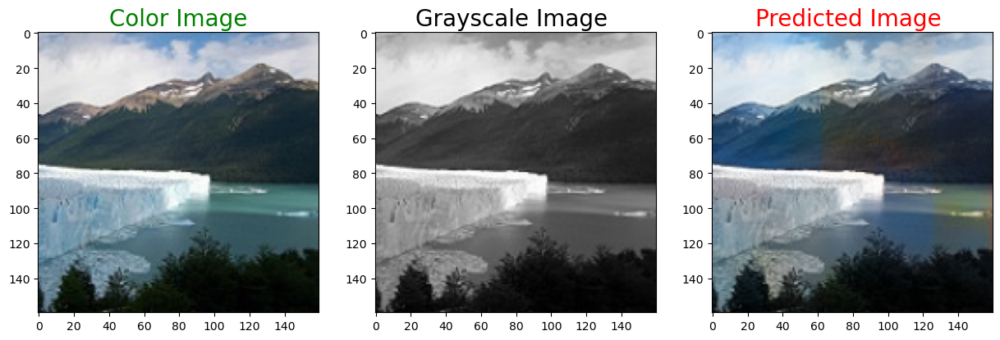

1/1 [==============================] - 0s 20ms/step


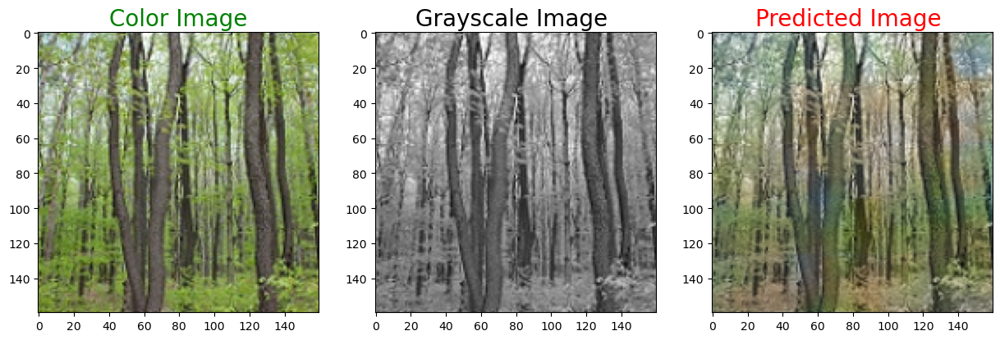

1/1 [==============================] - 0s 20ms/step


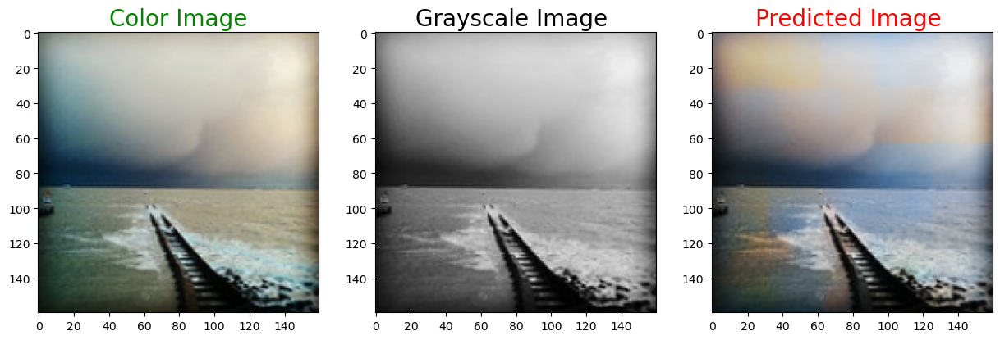

1/1 [==============================] - 0s 22ms/step


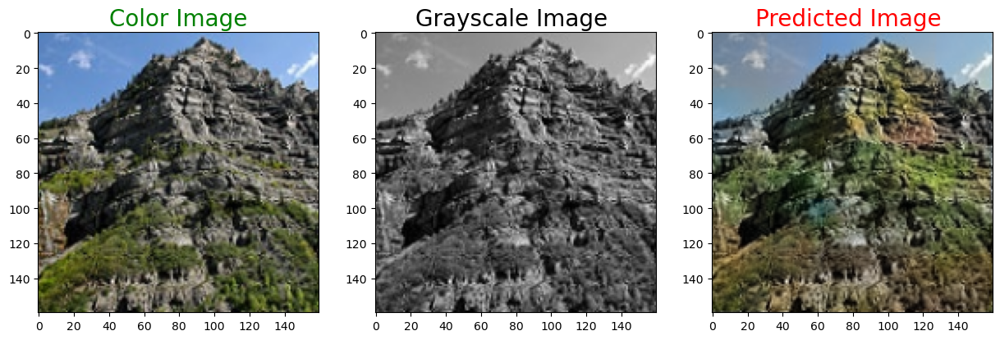

1/1 [==============================] - 0s 23ms/step


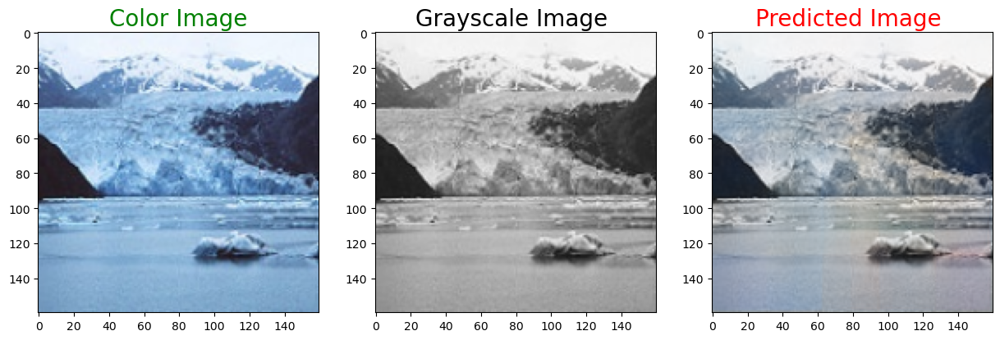

1/1 [==============================] - 0s 23ms/step


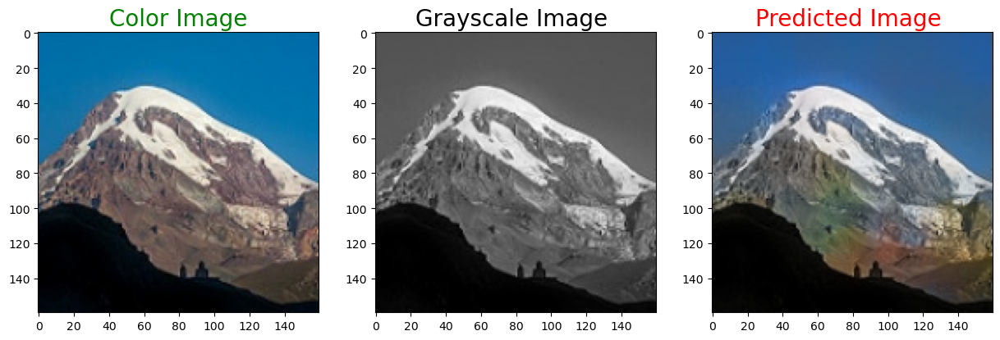

1/1 [==============================] - 0s 21ms/step


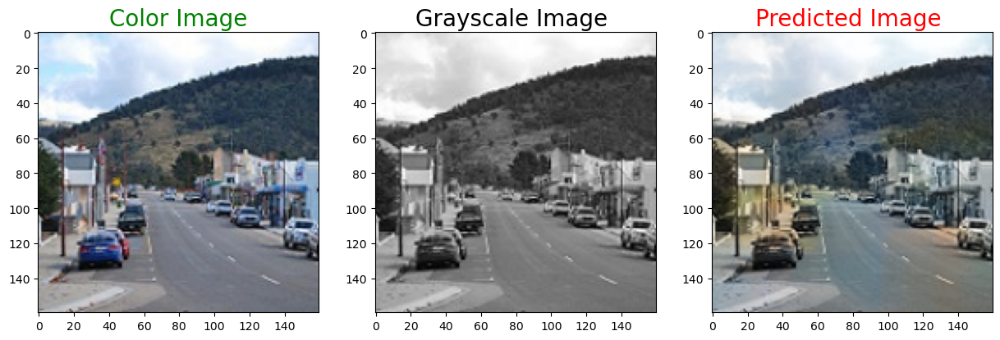

In [25]:
for i in range(81,100):
    predicted = np.clip(model.predict(test_gray_image[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3)
    plot_images(test_color_image[i],test_gray_image[i],predicted)